

# <img style="float: left; padding-right: 15px; width: 50px" src="https://raw.githubusercontent.com/Harvard-HES-ALM/master/main/ds-masters/content//images/hes-logo.png"> Harvard University<br><span style="font-size: smaller;"> DCE - Extension School</span>


## Advanced Deep Learning (CS104)
### Spring 2024

## Artemio Mendoza-García</br>

<hr style="height:2pt">

# Vector Databases and Embedding Matching: Unveiling the Celebrities Among Us

<hr style="height:2pt">

### Motivation
Have you ever wondered if a celebrity might be living among us—disguised as an ordinary person in your neighborhood, shopping at your local grocery store, or even studying alongside you in an advanced deep learning course?
In this notebook, we explore this intriguing idea by using a celebrity dataset containing over 200,000 images. We extract embeddings from these images and store them in a vector database. Then, we compare these embeddings against those generated from everyday individuals, shedding light on the possibility that a star might be hiding in plain sight.

### But, from where do we get Celebrities images?

We start with the [Dataset CELEBA, a well known collection of images from the university of Hong Kong](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). It contains more than 200,000 images from more than 10,000 celebrities. 

For this project, we use the ["in-the-wild" images, which are availble for download as a compressed file in this google drive](https://drive.google.com/drive/folders/0B7EVK8r0v71pWEZsZE9oNnFzTm8?resourcekey=0-5BR16BdXnb8hVj6CNHKzLg&usp=sharing).  

The compressed file size exceeds the 1.3 GB mark, and took about one hour to decompress. It was stored locally to speed the insert process.

### And, how do we extract the Vector Embeddings?

We use [DeepFace](https://github.com/serengil/deepface/tree/master), which abstract embedding extraction using different CNN SOTA models, among them:

* FaceNet (128d and 512d)
* VGG_Face
* OpenFace
* DeepFace

For this project, we used FaceNet. FaceNet was developed by Google in 2015. With 140 million of parameters and 22-layer depth, it achieves a prediction accuracy of 99.22% on LFW dataset. With this model Google introduced the *triplet loss function*, which works using forming triplets, with one anchor, positive example, and negative example. 

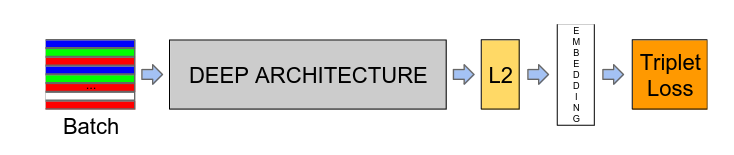

    The image above is a high level schema of the FaceNet architecture



### What about where tostore the Vector Embeddings?

For this project we are used Milvus, an Open-source Vector Database 

Milvus can be installed locally locally or in the cloud. For this project, we installed the Milvus locally, as a standalone instance with GPU support, [using the Docker image provided in the documentation manual](https://milvus.io/docs/install_standalone-helm-gpu.md). 

The standalone instance includes three components:

* Milvus: the core functional component.
* Meta Store: the medata engine, which access and stores metadata of Milvus'internal components, including proxies, index nodes, and more.
* Object Storage: The storage engine, which is responsible for data persistence for Milvus

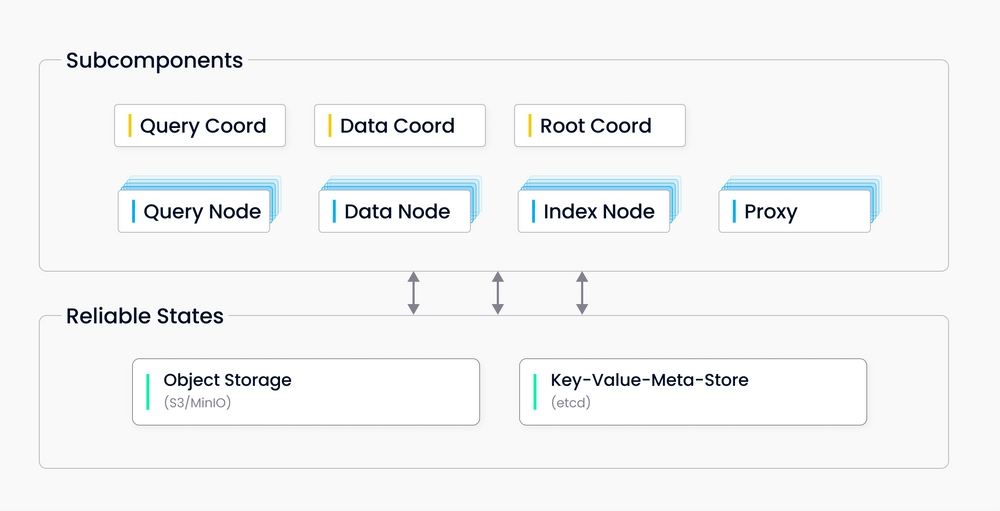

### Ok, we have all we need, now, let's code! 

In [643]:
import os
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D

import cv2
import numpy as np
from IPython.display import display, Image
import pandas as pd
import ipywidgets as widgets
import threading
from datetime import datetime 
from deepface import DeepFace

In [34]:
# Paths for images
CAPTURED_IMAGE_PATH='images'

# Local path with the dataset CELEBA
CELEBA_IMAGE_PATH="D:/Users/artex/Downloads/Compressed/img_align_celeba/img_align_celeba/"

# Task 1: Create Database with Vector Embeddings
---
We use Milvus and CelebA

### Step 1: Create Milvus Collection

#### Connect to Milvus

In [35]:
from pymilvus import (
    connections,
    utility,
    FieldSchema,
    CollectionSchema,
    DataType,
    Collection,
)

import pymilvus

# Connect to Milvus
connections.connect(host='localhost', port='19530')

In [36]:
# Get Milvus client version
print("Milvus client version:", pymilvus.__version__)

# Get Milvus server version
server_version = utility.get_server_version()
print("Milvus server version:", server_version)

Milvus client version: 2.4.1
Milvus server version: v2.4.0


#### Create the collection schema

In [37]:
from pymilvus import FieldSchema, CollectionSchema, DataType

fields = [
    FieldSchema(name="id", dtype=DataType.INT64, is_primary=True, auto_id=True),
    FieldSchema(name="embedding", dtype=DataType.FLOAT_VECTOR, dim=128),
    FieldSchema(name="x", dtype=DataType.INT32),
    FieldSchema(name="y", dtype=DataType.INT32),
    FieldSchema(name="w", dtype=DataType.INT32),
    FieldSchema(name="h", dtype=DataType.INT32),
    FieldSchema(name="confidence", dtype=DataType.FLOAT),
    FieldSchema(name="name", dtype=DataType.VARCHAR, max_length=255)
]

schema = CollectionSchema(fields, description="Face data collection")


In [38]:
# Create a collection
collection_name = "face_embeddings"
collection = Collection(name=collection_name, schema=schema)

#### Create the collection Index

In [39]:
# Create an index
index_params = {
    "index_type": "IVF_FLAT",
    "metric_type": "L2",
    "params": {"nlist": 100}
}
collection.create_index(field_name="embedding", index_params=index_params)

Status(code=0, message=)

#### Verify that the collection was created and its index

In [8]:
collection_list = utility.list_collections()
print("Collections:")
for collection_name in collection_list:
    print(collection_name)

print(f"number of entities: {collection.num_entities}")
print(collection.index)

Collections:
face_embeddings
number of entities: 187647
<bound method Collection.index of <Collection>:
-------------
<name>: face_embeddings
<description>: Face data collection
<schema>: {'auto_id': True, 'description': 'Face data collection', 'fields': [{'name': 'id', 'description': '', 'type': <DataType.INT64: 5>, 'is_primary': True, 'auto_id': True}, {'name': 'embedding', 'description': '', 'type': <DataType.FLOAT_VECTOR: 101>, 'params': {'dim': 128}}, {'name': 'x', 'description': '', 'type': <DataType.INT32: 4>}, {'name': 'y', 'description': '', 'type': <DataType.INT32: 4>}, {'name': 'w', 'description': '', 'type': <DataType.INT32: 4>}, {'name': 'h', 'description': '', 'type': <DataType.INT32: 4>}, {'name': 'confidence', 'description': '', 'type': <DataType.FLOAT: 10>}, {'name': 'name', 'description': '', 'type': <DataType.VARCHAR: 21>, 'params': {'max_length': 255}}], 'enable_dynamic_field': False}
>


### Step 2: Extract Embedings and Load Milvus DB

#### Extract embedings using deepface 

In [26]:
def get_embeddings(image_path, model_name):
    #extract the face image and embeddings
    # face_image = DeepFace.extract_faces(image_path, enforce_detection=True)

    # Enforce_Detection = True if the image wasn't pre-extracted (extract_features not used before)
    # face_vector = DeepFace.represent(face_image[0]['face'], model_name=model_name, enforce_detection=False)
    face_vector = DeepFace.represent(image_path, model_name=model_name, enforce_detection=True)

            
    # split vector into embeddings, metadata, and confidence
    embedding = face_vector[0]['embedding']
    metadata = face_vector[0]['facial_area']
    confidence = face_vector[0]['face_confidence']   

    return embedding, metadata, confidence


#### Format Vector Embeddings and Metadata

In [27]:
def fill_data_collection(embedding, metadata, confidence, filename):
    # Fill Data Collection 
    data = [
        {
            "embedding": embedding, 
            "x": metadata['x'],
            "y": metadata['y'],
            "w": metadata['w'],
            "h": metadata['h'],
            "confidence": confidence,
            "name": filename
        },
        # More data entries
    ]

    # Prepare the data for insertion
    embeddings = [entry["embedding"] for entry in data]
    xs = [entry["x"] for entry in data]
    ys = [entry["y"] for entry in data]
    ws = [entry["w"] for entry in data]
    hs = [entry["h"] for entry in data]
    confidences = [entry["confidence"] for entry in data]
    names = [entry["name"] for entry in data]   

    return [embeddings, xs, ys, ws, hs, confidences, names]

#### Insert Vector embeddings and metadata into Milvus

In [ ]:
def insert_image(image_path):
    embedding, metadata, confidence = get_embeddings(image_path, model_name[0])
    if confidence == 0.0: 
        raise ValueError(f"confidence is zero")
    # Format data collection 
    data_collection = fill_data_collection(embedding, metadata, confidence, os.path.basename(image_path))
    # Insert data into Milvus
    insert_result = collection.insert(data_collection)

#### Function to populate the Vector Database

In [1164]:
def populate_vdb(image_directory, idx_start, idx_end):
    # Get list of files
    file_list = [f for f in os.listdir(image_directory)[idx_start:idx_end] if f.endswith(".jpg")]

    # initialize progress bar
    for filename in tqdm(file_list, desc="Processing Images"):
        # Sanity check for type of image
        image_path = os.path.join(image_directory, filename)
        # print(image_path)
        try:
            # Retrives vector embeddings
            insert_image(image_path)
            # embedding, metadata, confidence = get_embeddings(image_path, model_name[0])
            # if confidence == 0.0: 
            #     raise ValueError(f"confidence is zero")
            # # Format data collection 
            # data_collection = fill_data_collection(embedding, metadata, confidence, filename)
            # # Insert data into Milvus
            # insert_result = collection.insert(data_collection)
    
        except Exception as e:
            log_error_images.append({
                'image_path':image_path,
                'error_msg':f"Failed to process {filename}: {str(e)}"
            })   
            # print(log_error_images[-1]['error_msg'])

#### Now we can populate the collection!

In [310]:
image_directory=CELEBA_IMAGE_PATH
# image_directory='CelebA Dataset/' 
# Get Vector Embeddings and Metadata
model_name = ["Facenet","VGG-Face","OpenFace","DeepFace"]
log_error_images=[]

# Insert only a chunk of Images
img_start_idx = 2000
img_idx_size  = 1500
img_end_idx = img_start_idx+img_idx_size

populate_vdb(image_directory, img_start_idx, None)

Processing Images: 100%|█████████████████████████████████████████████████████| 200599/200599 [9:26:04<00:00,  5.91it/s]


#### Quick log 

In [311]:
from pymilvus import Collection

# Assuming 'collection_name' is your collection's name
collection = Collection(name=collection_name)

# Load the collection to refresh its state
collection.load()

# Try to fetch the number of entities
try:
    num_entities = collection.num_entities
    total_images = num_entities + len(log_error_images)    
    print(f"{total_images:,} images processed, {num_entities:,} images loaded. {len(log_error_images):,} failed to load")    
    
except Exception as e:
    print(f"Error fetching entity count: {str(e)}")

201,765 images processed, 186,954 images loaded. 14,811 failed to load


#### Show (some) images not loaded

In [40]:
def show_image_array(image_array, suptitle, celeb_id=None):
    # array_images is the list of image file paths to show
    n = len(image_array)  # Number of images
    ncols = 3  # Number of columns
    nrows = (n + ncols - 1) // ncols  # Calculate the number of rows needed
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, (15/ncols) * nrows))
    axes = axes.flatten()  # Flatten the grid to make indexing easier

    celeb = None
    for i, img_path in enumerate(image_array):
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        # axes[i].axis('off')  # Hide axes
        if celeb_id: x_label = f"Celeb ID: {celeb_id[i]}"
        else: x_label = f"{os.path.basename(img_path)}"
        # get file or celeb id    
        axes[i].set_xlabel(x_label)
    
    # Turn off axes for any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(suptitle,size=21)
    plt.tight_layout()
    plt.show()

Images with error

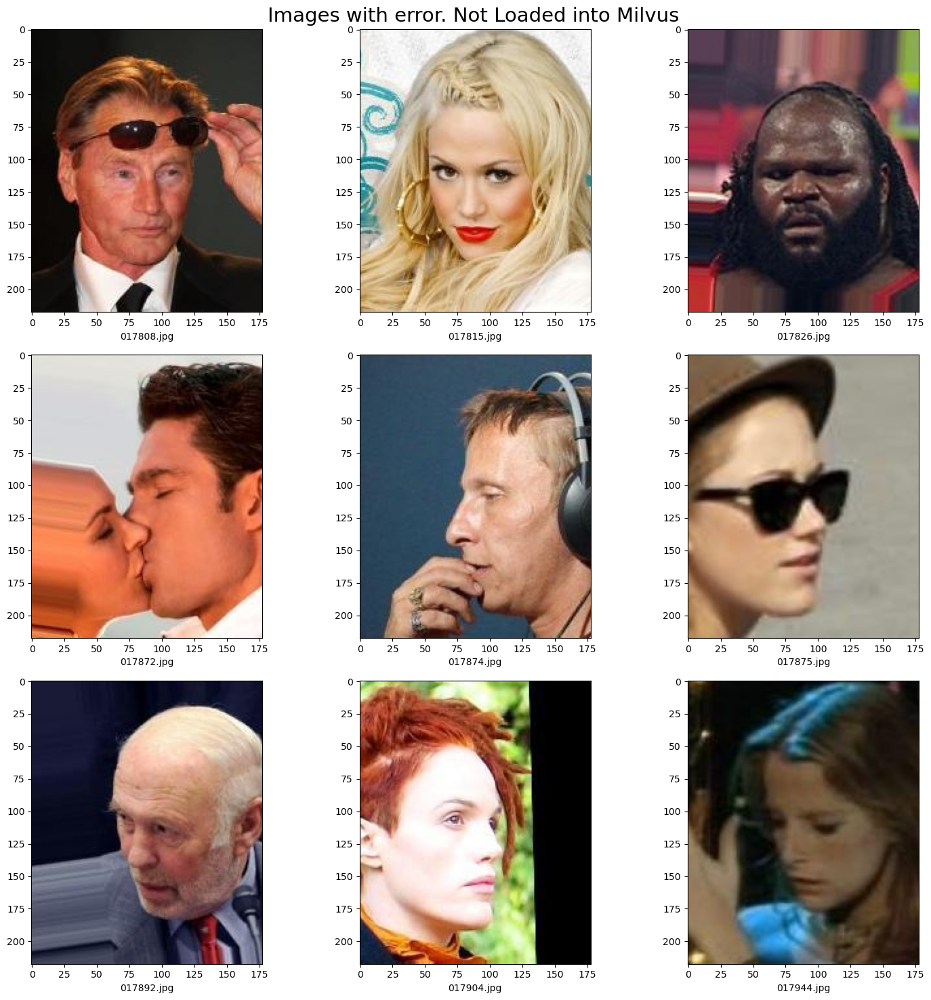

In [1347]:
log_image_array = []
ini=1221 #is a good index
end=ini+9

# Extract the list of images to show
for log_error_image in log_error_images[ini:end]:
    img_path = log_error_image['image_path']
    log_image_array.append(img_path)

# plot images
show_image_array(log_image_array, "Images with error. Not Loaded into Milvus")

---
# Task 2: Perform Similarity Search 
---
Once we have our vector embedding, we can perform image similarity search by querying our Vector DB using Cosine Distance.

For this purpose, we will do it in three use cases.

## Use Case: Real-Time detection using the WebCam

In this use case I'll take a picture from my webcam to find what celebrities are similar to my face. 

### Step 1: take several pictures 
---


In [157]:
# Capture Code based on Medium Post from Arthur Bauville: Display your live webcam feed in a Jupyter notebook using OpenCV
# See references at the end of the notebook

In [146]:
# Stop button
stopButton = widgets.ToggleButton(
    value=False,
    description='Stop',
    disabled=False,
    button_style='danger', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Stop Streaming',
    icon='square' # (FontAwesome names without the `fa-` prefix)
)

# Capture Button
captureButton = widgets.ToggleButton(
    value=False,
    description='Capture',
    disabled=False,
    button_style='info', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Capture Image',
    icon='camera' # (FontAwesome names without the `fa-` prefix)
)

def view(button):
    '''
    Display Image
    '''
    cap = cv2.VideoCapture(0)
    display_handle=display(None, display_id=True)
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.flip(frame, 1) # Flip frame horizontally

        # Convert frame for display
        _, buffer = cv2.imencode('.jpeg', frame)
        display_handle.update(Image(data=buffer.tobytes()))
        
        # Check if we need to capture this frame
        if captureButton.value:
            timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
            filename = f"{CAPTURED_IMAGE_PATH}/captured_image_{timestamp}.jpg"
            # Save Captured image
            cv2.imwrite(filename, frame)
            print(f"Image Captured and saved {filename}")
            captured_image.append(filename)
            captureButton.value = False # Reset button state

        # Check if stop button was pressed
        if stopButton.value==True:
            break
                  
    cap.release()
    display_handle.update(None)
    
    return filename 
    
# Button Events= handlers
def on_capture_clicked(b):
    # Signals that the next frame should be captured
    captureButton.value = True

In [10]:
# Initialize array with captured images
captured_image = []

# Display buttons and start thread
button_box = widgets.HBox([captureButton, stopButton])
display(button_box)
thread = threading.Thread(target=view, args=(stopButton,))
thread.start()

None

Image Captured and saved images/captured_image_2024-05-07_02-16-24.jpg
Image Captured and saved images/captured_image_2024-05-07_02-16-29.jpg
Image Captured and saved images/captured_image_2024-05-07_02-16-33.jpg
Image Captured and saved images/captured_image_2024-05-07_02-16-43.jpg
Image Captured and saved images/captured_image_2024-05-07_02-16-47.jpg
Image Captured and saved images/captured_image_2024-05-07_02-17-03.jpg


### Step 2: Get Image Vector Embedding

#### Let's review the images and pick one for querying the DB

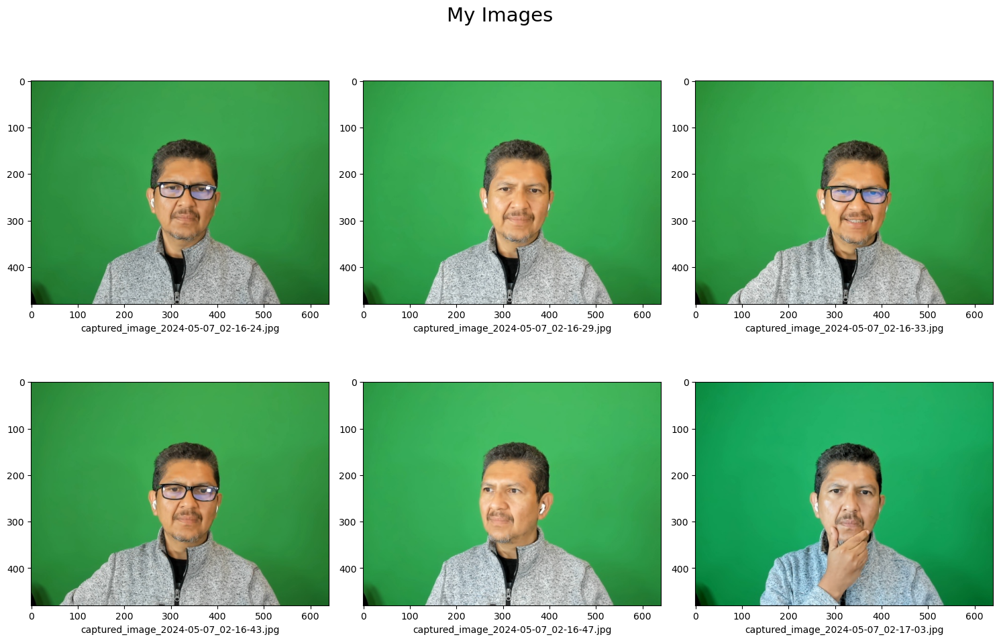

In [778]:
show_image_array(captured_image, "My Images")

#### So we can pick the best one

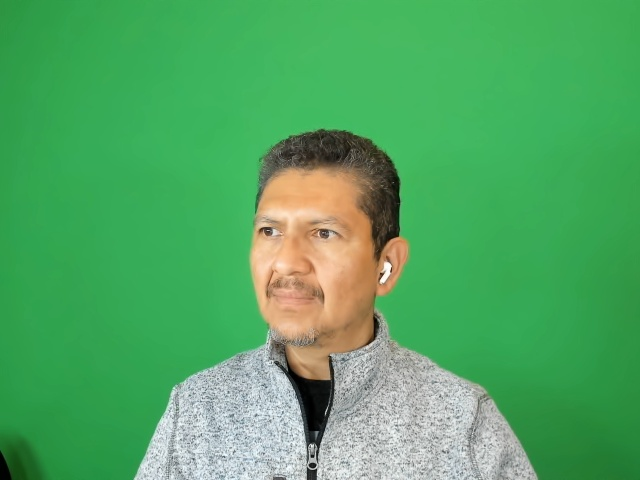

In [798]:
# Number of image to do the search
image_number = 4
# Get one of the images
user_img_path = captured_image[image_number]

# Display an image file
Image(filename=user_img_path)

#### And extract the Image Feature (my face) from the picture using deepface

In [799]:
def show_all_faces(user_img, suptitle, num_columns=2):
    ext_faces = []
    num_images = len(user_img)
    cols = num_columns # Number of columns
    rows = (num_images // cols) + (num_images % cols > 0)  # Calculate the number of rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(5, 1.5 * rows))
    
    for i, face in enumerate(user_img):
        ext_faces.append(face['face'])
        ax = axes[i // cols, i % cols]
        ax.imshow(ext_faces[-1])
        ax.set_title(f"image {i}")
        ax.axis('off')  # Hide the axes
    
    # Hide any unused subplots
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j // cols, j % cols])

    plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

# In case there are multiple ppl in the picture
def show_one_face(user_img, face_num):
    # inspect captured image extraction
    plt.figure(figsize=(2, 2))
    plt.imshow(user_img[face_num]['face'])
    # plt.imshow(my_img)
    plt.title(f'Face extracted # {face_num}')
    plt.tight_layout()
    plt.show()

def split_img_vector(img_vector, face_num):
    # split vector into embeddings, metadata, and confidence
    img_embedding = img_vector[face_num]['embedding']
    img_metadata = img_vector[face_num]['facial_area']
    img_confidence = img_vector[face_num]['face_confidence']

    return img_embedding, img_metadata, img_confidence

In [800]:
def get_similar_images(user_img_path, face_num=0):
    # Get Vector Embeddings and Metadata
    model_name = ["Facenet","VGG-Face","OpenFace","DeepFace"]
    
    # Get one of the images
    user_img = DeepFace.extract_faces(user_img_path, enforce_detection=True)
    
    user_img_vector = DeepFace.represent(user_img_path, model_name=model_name[0], enforce_detection=True)
    
    # split vector into embeddings, metadata, and confidence
    user_img_embedding, user_img_metadata, user_img_confidence = split_img_vector(user_img_vector, face_num)
    
    # Get matched objects
    matched_ids = query_collection(user_img_embedding)
    matched_images, matched_embeddings = get_matches(matched_ids)
    matched_img_path, matched_img_id = get_matched_paths(user_img_path, matched_images)

    return matched_img_path, matched_img_id, user_img, user_img_embedding

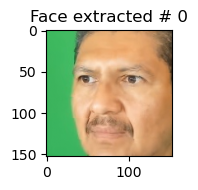

In [801]:
# Get image feature (my face)
user_img = DeepFace.extract_faces(user_img_path, enforce_detection=True)
# I know there is only one face in this picture, which is mine (face_num=0)
show_one_face(user_img,face_num=0)

#### We get the vector embedding and metadata

In [802]:
# Get Vector Embeddings and Metadata
model_name = ["Facenet","VGG-Face","OpenFace","DeepFace"]

user_img_vector = DeepFace.represent(user_img_path, model_name=model_name[0], enforce_detection=True)

# split vector into embeddings, metadata, and confidence
user_img_embedding, user_img_metadata, user_img_confidence = split_img_vector(user_img_vector, face_num)

#### Metadata and Embeddings

In [803]:
# Shows 10 dimensions of vector embeddings]
show_dims=10
print(f"Embedding Vector Dimension: {len(user_img_embedding)}")
print(f"First {show_dims} dimensions")
display(user_img_embedding[:show_dims])

print(f"\nMetadata {user_img_metadata}")
print(f"Feature extraction confidence: {user_img_confidence}")

Embedding Vector Dimension: 128
First 10 dimensions


[-1.5355143547058105,
 -0.21743208169937134,
 0.3877891004085541,
 -0.4349514842033386,
 0.1683000922203064,
 0.72022545337677,
 0.9845176935195923,
 1.6162538528442383,
 -0.2157813310623169,
 0.5454258322715759]


Metadata {'x': 220, 'y': 174, 'w': 153, 'h': 153, 'left_eye': (320, 233), 'right_eye': (267, 231)}
Feature extraction confidence: 0.91


### Step 3: Search similar vector embeddings

Now that we have my face's vector embeddings, we can query the Vector DB to find these vectors most similars to mine

#### First, let's get the list of Celebrities IDs 
Note: the Dataset doesn't inclue the name of the celebrities, only their numerical IDs.

In [804]:
# Path to your file
file_path = 'CelebA Dataset/identity_CelebA.txt'

# Read the file into a DataFrame
df = pd.read_csv(file_path, delim_whitespace=True, header=None, names=['filename', 'identity_id'])

# Helper function to get celeb Identity given a picture filename
def get_identity(filename):
    identity_id = None
    identity_ids = df[df['filename'] == filename]['identity_id'].values
    if identity_ids.size > 0:
        identity_id = identity_ids[0]
    else:
        identity_id = "Original Image"
    return identity_id

# Helper function to get the matched ids from the Vector DB
def query_collection(user_img_embedding, num_of_images = 8):
    # The embedding you want to search with
    query_embedding = user_img_embedding  
    
    # Define your search parameters
    search_params = {
        "metric_type": "L2",  # or "IP" depending on your distance calculation preference
        "params": {"nprobe": 1000}
    }
    
    # Perform the search
    results = collection.search(
        [query_embedding], "embedding", search_params, limit=num_of_images
    )
    
    # And stitch together results
    matched_ids = []
    for result in results[0]:
        matched_ids.append(result.id)

    return matched_ids

# Helper function to get the matched images and embeddings
def get_matches(matched_ids):
    matched_images, matched_embeddings = [],[]
    
    for entity_id in matched_ids:
    # Perform the query
        # Here, `output_fields` specifies which fields we want to retrieve
        query_results = collection.query(expr=f"id == {entity_id}", output_fields=["*"])
        
        # Display the results
        matched_images.append(query_results[0]['name'])
        matched_embeddings.append(query_results[0]['embedding'])
        
    return matched_images, matched_embeddings

# Helper function to get image path and image ids
def get_matched_paths(user_img_path, matched_images):

    matched_img_path = [user_img_path]
    matched_img_id = [get_identity(user_img_path)]
    
    for matched_filename in matched_images:
        matched_img_id.append(get_identity(matched_filename))
        matched_img_path.append(os.path.join(CELEBA_IMAGE_PATH,matched_filename))
        
    return matched_img_path, matched_img_id

#### Then we query the Collection in Milvus and get the images with smallest cosine distance

In [805]:
matched_ids = query_collection(user_img_embedding)
matched_images, matched_embeddings = get_matches(matched_ids)
matched_img_path, matched_img_id = get_matched_paths(user_img_path, matched_images)

#### Finally, we can plot the closest images 

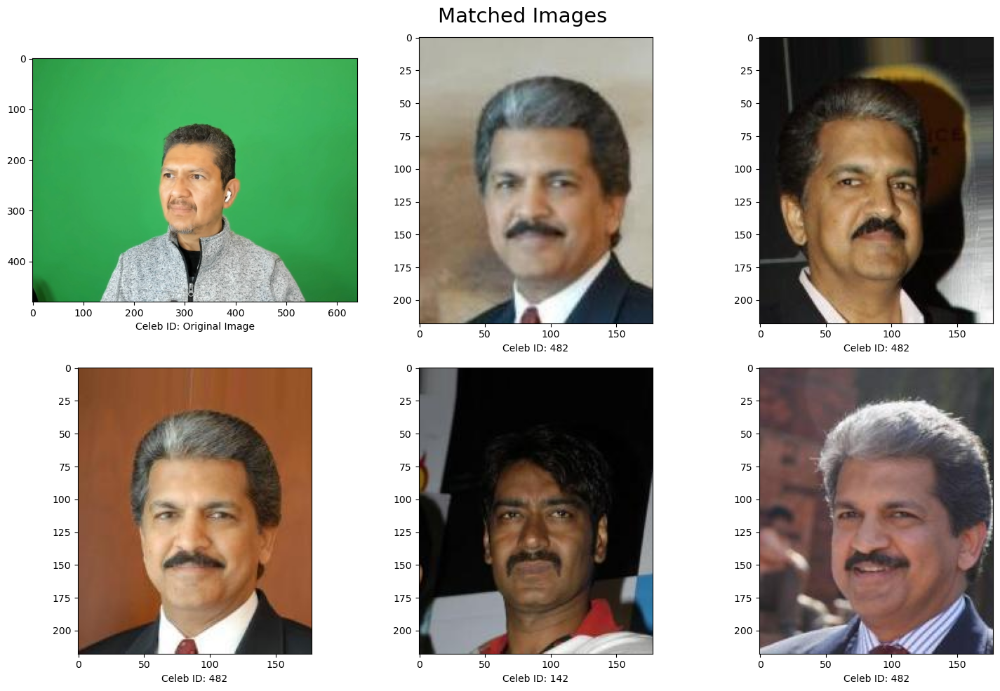

In [822]:
# plot images
show_image_array(matched_img_path[:6], "Matched Images", celeb_id=matched_img_id)

### Step 4 : Evaluation

#### First Method: 2D Embeddings

To do a quick visualization that allow us to compare the embeddings, we use this trick [taken from this post](https://sefiks.com/2020/05/01/a-gentle-introduction-to-face-recognition-in-deep-learning/) to convert the 1D vector embeddings into a 2D matrix embedding, so, the vectors look like a barcode that can be visualized and compared among different images. 

The trick is simple: duplicate the embeddings in several rows, so we get a matrix, as shown in the function *get_2D_embeddings* 

In [808]:
# Converts vector embedding into a matrix embedding
def get_2D_embeddings(embeddings, height=10):
    embedding_2d = []
    for i in range(0, height):
        embedding_2d.append(embeddings)

    return embedding_2d

In [819]:
# Get first elements of the list
images   = [user_img[face_num]['face']]
images = [mpimg.imread(user_img_path)]
barcodes = [get_2D_embeddings(user_img_embedding)]

# now we can iterate and add the matched images on the list 
for i, image_path in enumerate(matched_img_path[1:]):
    if i==0:
        pass
    images.append(mpimg.imread(image_path))
    barcodes.append(get_2D_embeddings(matched_embeddings[i]))

In [820]:
def plot_single_image_barcode(match_number):
    '''
    Plot only the match specified in the match_number
    '''    
    # The original image is always 0
    original_number=0

    # Get the images and the 2D embeddings
    img1 = images[original_number]
    img2 = images[match_number]
    img1_graph = barcodes[original_number]
    img2_graph = barcodes[match_number]

    # Now, plot logic 
    fig = plt.figure(figsize=(8, 3))
    
    # Create a GridSpec with 2 rows and 4 columns, with the second column wider
    gs = gridspec.GridSpec(2, 4, width_ratios=[1, 3, 0.1, 0.1])
    
    # Plot first image
    ax1 = fig.add_subplot(gs[0, 0])
    plt.imshow(img1)
    
    plt.title("Original Img")
    plt.axis('off')
    
    # Plot first graph, larger subplot
    ax2 = fig.add_subplot(gs[0, 1:3])
    im = plt.imshow(img1_graph, interpolation='nearest', cmap=plt.cm.ocean)
    plt.colorbar(im, cax=fig.add_subplot(gs[0, 3]))
    
    # Plot second image
    ax3 = fig.add_subplot(gs[1, 0])
    plt.imshow(img2)
    plt.title(f"Celeb ID: {matched_img_id[match_number]}")    
    plt.axis('off')
    
    # Plot second graph, larger subplot
    ax4 = fig.add_subplot(gs[1, 1:3])
    im = plt.imshow(img2_graph, interpolation='nearest', cmap=plt.cm.ocean)
    plt.colorbar(im, cax=fig.add_subplot(gs[1, 3]))
    
    plt.tight_layout()
    plt.show()

def plot_all_images_with_barcodes(images, barcodes):
    '''
    Plot all the matches in the arrays images and barcodes
    '''
    num_pairs = min(len(images), len(barcodes))
    fig = plt.figure(figsize=(7.5, 1.5 * num_pairs))
    gs = gridspec.GridSpec(num_pairs, 4, width_ratios=[1, 3, 0.1, 0.2])

    for i in range(num_pairs):
        img = images[i]
        img_graph = barcodes[i]

        # Plot image
        ax1 = fig.add_subplot(gs[i, 0])
        plt.imshow(img)
        if i == 0: img_id = 'Original IMG'
        else: img_id = f"Celeb ID: {matched_img_id[i]}"
        plt.title(img_id)
        plt.axis('off')

        # Plot graph, larger subplot
        ax2 = fig.add_subplot(gs[i, 1:3])
        im = plt.imshow(img_graph, interpolation='nearest', cmap=plt.cm.ocean)
        plt.colorbar(im, cax=fig.add_subplot(gs[i, 3]))

    plt.tight_layout()
    plt.show()

Now we are ready to compare embeddings

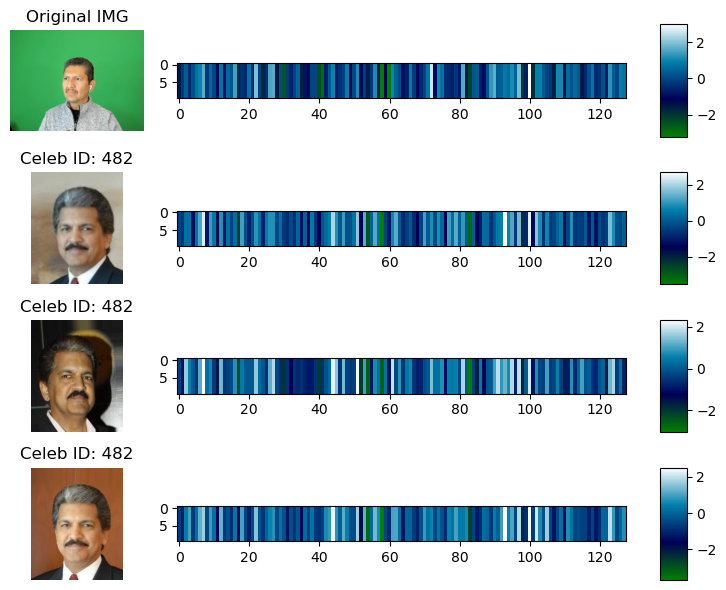

In [821]:
plot_all_images_with_barcodes(images[:4], barcodes[:4])

### Use Case 2: Group Picture

What if we have a group picture? We can leverage DeepFace to extract the faces from the image, conveniently indexed so they can be individuale queried against the Vector DB

#### Looking for an individual face in a group

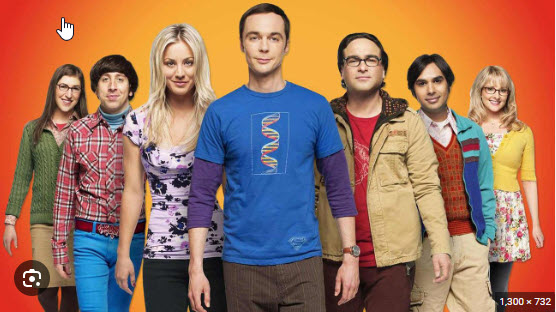

In [542]:
user_img_path = "images/bigbang.jpg"

# Display an image file
Image(filename=user_img_path)

#### We extract the faces from the group picture 

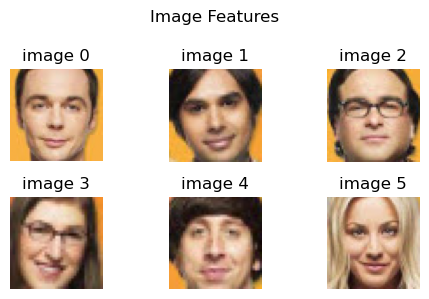

In [544]:
# Get image feature (my face)
user_img = DeepFace.extract_faces(user_img_path, enforce_detection=True)
show_all_faces(user_img, "Image Features", num_columns=3)

### Then we can pick one person from the group to search in the database

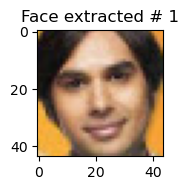

In [554]:
# Index for the face we want to search
face_num = 1
show_one_face(user_img, face_num)

#### Find vector embeddings

In [555]:
user_img_vector = DeepFace.represent(user_img_path, model_name=model_name[0], enforce_detection=True)
user_img_embedding, user_img_metadata, user_img_confidence = split_img_vector(user_img_vector, face_num)

#### Query our Database

In [556]:
matched_ids = query_collection(user_img_embedding)
matched_images, matched_embeddings = get_matches(matched_ids)
matched_img_path, matched_img_id = get_matched_paths(user_img_path, matched_images)

#### Plot similarities

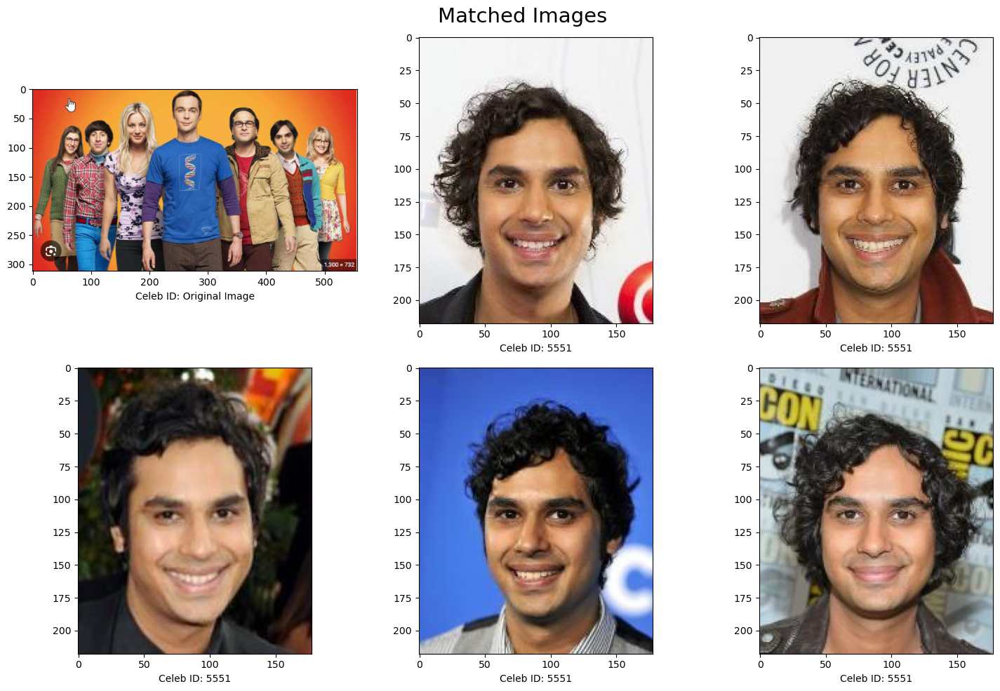

In [557]:
# plot images
max_images = 6
show_image_array(matched_img_path[:max_images], "Matched Images", celeb_id=matched_img_id)

### Or we can process the entire group at once

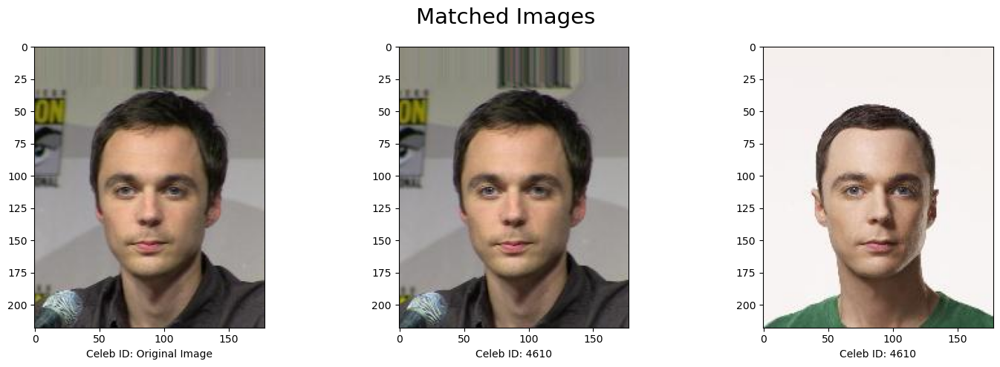

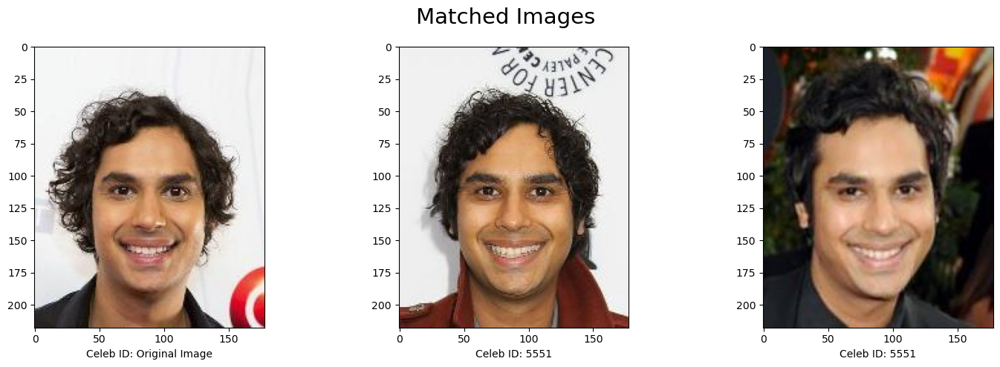

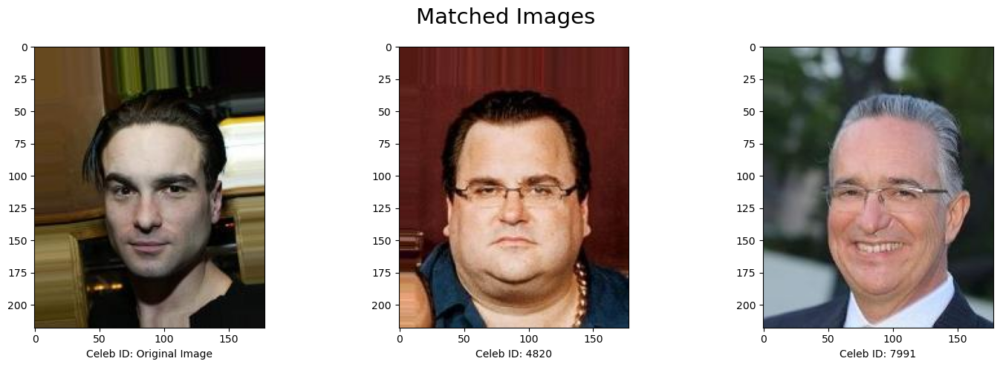

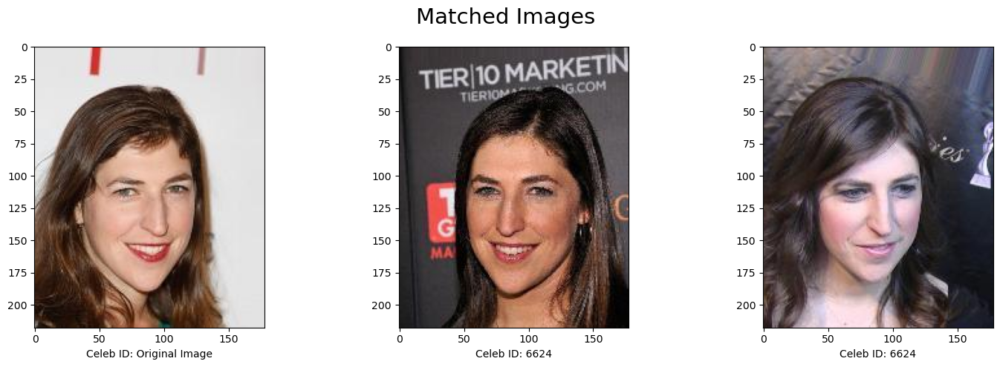

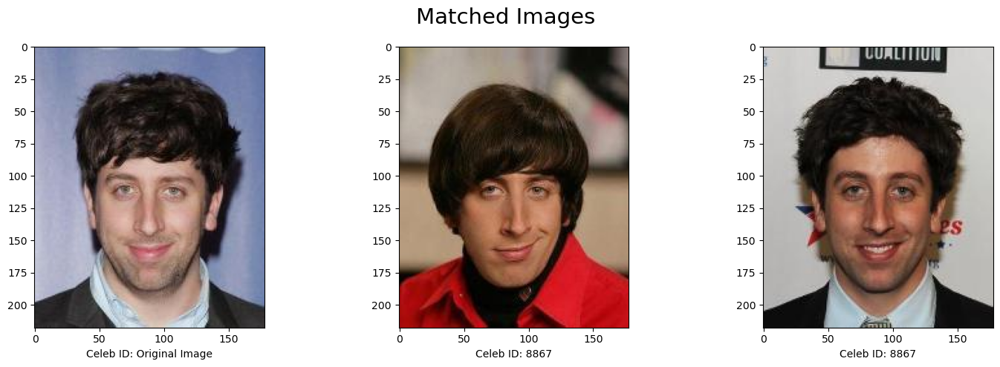

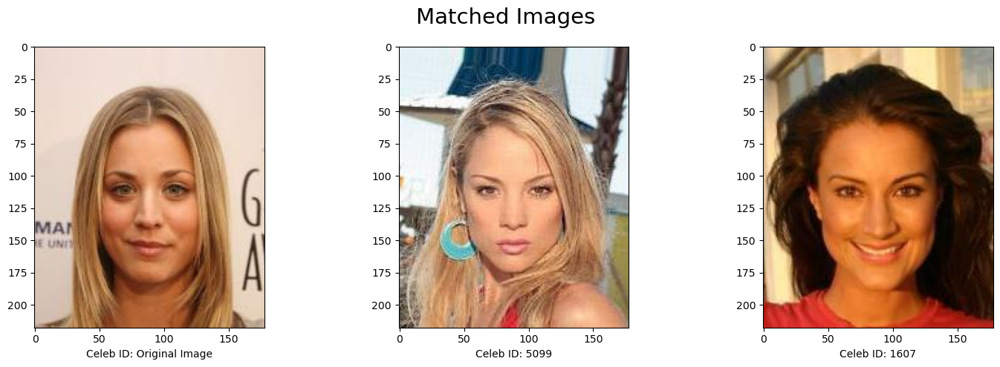

In [726]:
for i in range(0,len(user_img)):

    # Index for the face we want to search
    face_num = i
    max_images = 4
    
    # query database and plot similarities
    matched_img_path, matched_img_id, user_img, _ = get_similar_images(user_img_path, face_num)
    # show_one_face(user_img, face_num)
    show_image_array(matched_img_path[1:max_images], "Matched Images", celeb_id=matched_img_id)

## Evaluating results using PCA and KMeans

We used PCA to reduce the dimensionality of the embeddings and perform a KMeans operation to observe if the images are clustered, suggesting similarity.

As observed in the plots below, the embeddings created clusters, as expected. In the 3D plot we can asses that the number of clusters are similar to the number of faces; however, not all the images are perfectly matched, as shown in the graph with faces above.


In [661]:
# Get the Embeddings
all_embeddings = []
for i in range(0, len(user_img)):
    face_num = i

    user_img_vector = DeepFace.represent(user_img_path, model_name=model_name[0], enforce_detection=True)
    user_img_embedding, _, _ = split_img_vector(user_img_vector, face_num)

    matched_ids = query_collection(user_img_embedding, 9)
    _, matched_embeddings = get_matches(matched_ids)
    
    all_embeddings = all_embeddings + matched_embeddings

In [673]:
def plot_PCA_2D(embeddings, k=6):
    # Apply PCA
    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(embeddings)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)  
    labels = kmeans.fit_predict(embeddings)
    
    # Plot
    plt.figure(figsize=(8, 6))
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=labels, cmap='viridis', s=50)
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('2D PCA of 128-Dimensional Embeddings with KMeans Clustering')
    plt.colorbar(label='Cluster')
    plt.show()

In [674]:
def plot_PCA_3D(embeddings, k=6):
    # Apply KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(embeddings)
    
    # Apply PCA
    pca = PCA(n_components=3)
    X_reduced_3d = pca.fit_transform(embeddings)
    
    # Plot the 3D PCA
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(X_reduced_3d[:, 0], X_reduced_3d[:, 1], X_reduced_3d[:, 2], 
                         c=labels, cmap='viridis', s=50, edgecolor='k')
    
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('3D PCA of 128-Dimensional Embeddings with KMeans Clustering')
    
    # Add color bar
    colorbar = plt.colorbar(scatter)
    colorbar.set_label('Cluster')
    
    plt.show()

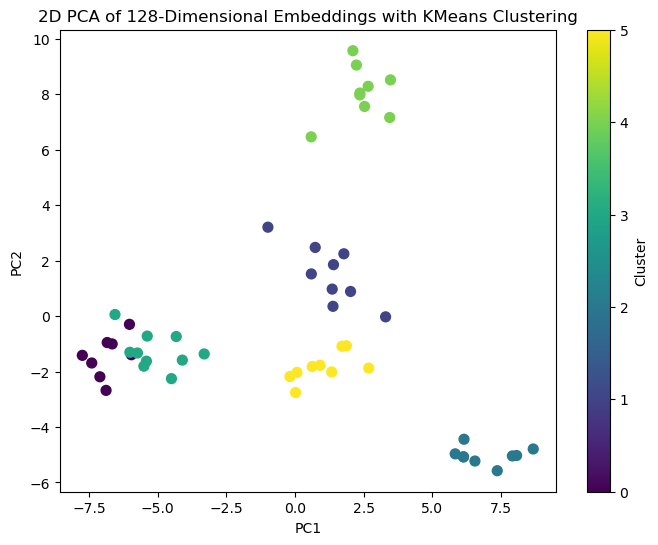

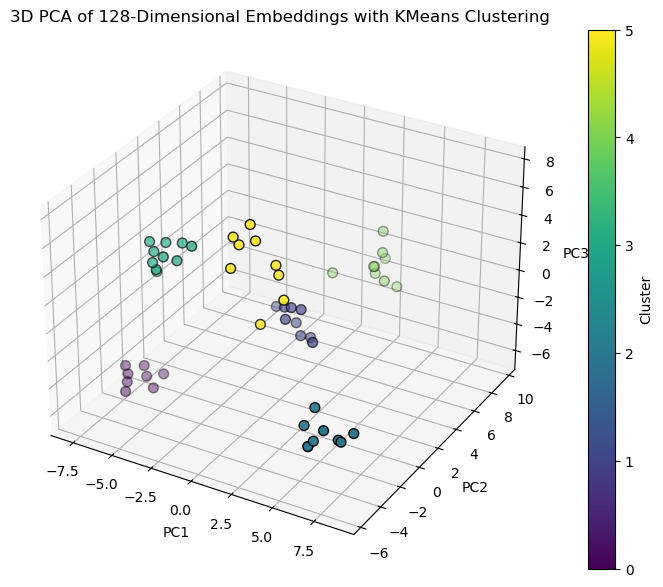

In [675]:
embeddings = np.array(all_embeddings[:])

plot_PCA_2D(embeddings)
plot_PCA_3D(embeddings)

## User Case 3: Is Cerys an undercover Celebritiy?

In our third and last use case, we will try to unveil one of the misteries of the DS community: Is Cerys Prick an undercover celebrity?

We start with the images below and then we do a search in our vector database.

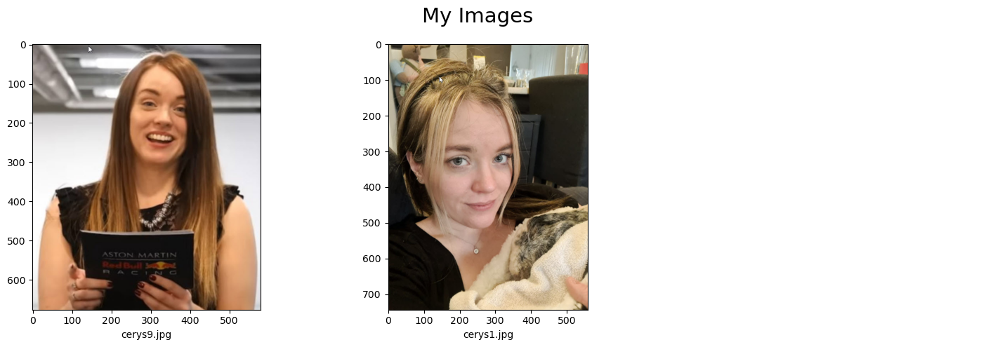

In [685]:
# Celebrities and friends - Use case 2
captured_image=[
     "images/cerys9.jpg"    
    ,"images/cerys1.jpg"
    ,"images/emma_stone3.jpg"
]
show_image_array(captured_image[:2], "My Images")

#### Results after matching against our embeddings,
we get the closest match with Katy Perry in the first image, and a close 4th match in the second one.

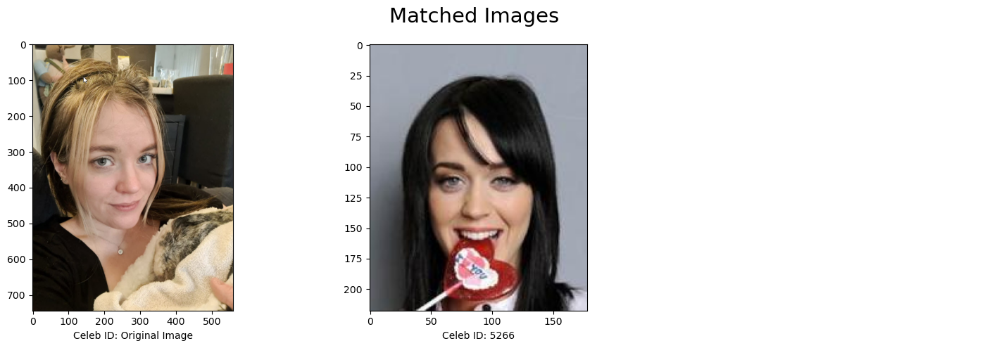

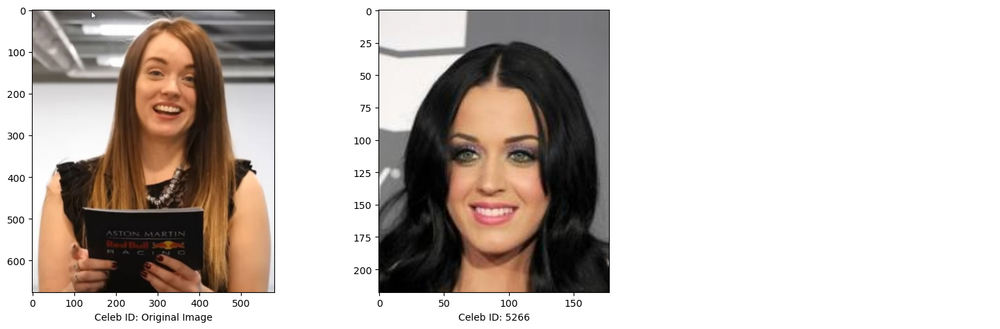

In [729]:
cerys_matched_img1_path, cerys_matched_img1_id,cerys_face1, cerys_img1_embedding = get_similar_images("images/cerys1.jpg",face_num=0)
cerys_matched_img2_path, cerys_matched_img2_id,cerys_face2, cerys_img2_embedding = get_similar_images("images/cerys9.jpg",face_num=0)

# Now we can plot
show_image_array(cerys_matched_img1_path[:2], "Matched Images", celeb_id=cerys_matched_img1_id)
show_image_array(cerys_matched_img2_path[:1] + cerys_matched_img2_path[6:7], '', cerys_matched_img2_id[:1] + cerys_matched_img2_id[6:7])

## Evaluating our Results using 2D Embeddings
We can use our "bar code" method to do a visual evaluation of the embeddings

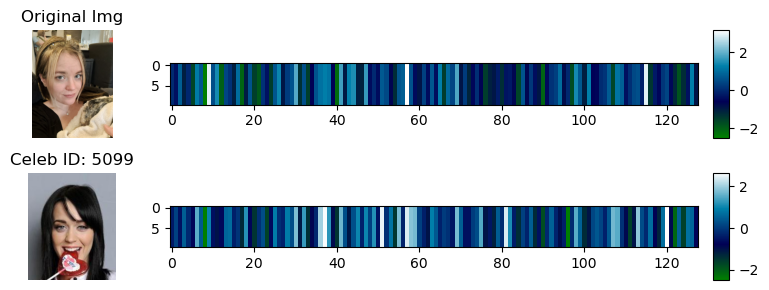

In [774]:
# Get first elements of the list
face_num=0
images   = []
barcodes = [get_2D_embeddings(cerys_img1_embedding)]

# now we can iterate and add the matched images on the list 
for i, image_path in enumerate(cerys_matched_img1_path[:]):
    if i==0:
        pass
    images.append(mpimg.imread(image_path))
    barcodes.append(get_2D_embeddings(matched_embeddings[i]))

# Plot image
plot_single_image_barcode(1)

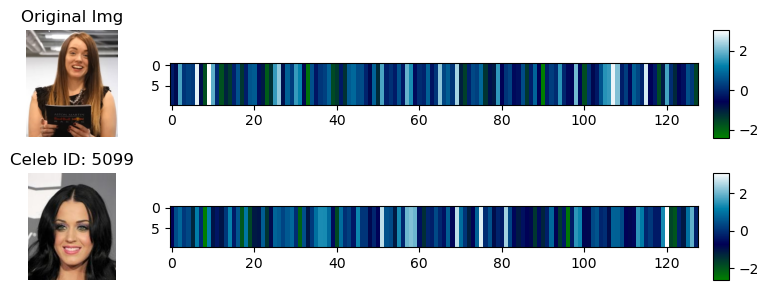

In [771]:
# Get first elements of the list
images   = []
barcodes = [get_2D_embeddings(cerys_img2_embedding)]

# now we can iterate and add the matched images on the list 
for i, image_path in enumerate(cerys_matched_img2_path[:]):
    if i==0:
        pass
    images.append(mpimg.imread(image_path))
    barcodes.append(get_2D_embeddings(matched_embeddings[i]))

# Plot image
plot_single_image_barcode(6)    

## Evaluating our Results Empirically 

However, empirically **we know** that the models' performance is not OK, because it is already stablished that Cerys is not Katy Perry, but **Ema Stone**, disguised as a HES student, learning her character for the role she will play in her next Data Scientist Sci-Fi Action movie.

The similitude is stablished in the graph below.

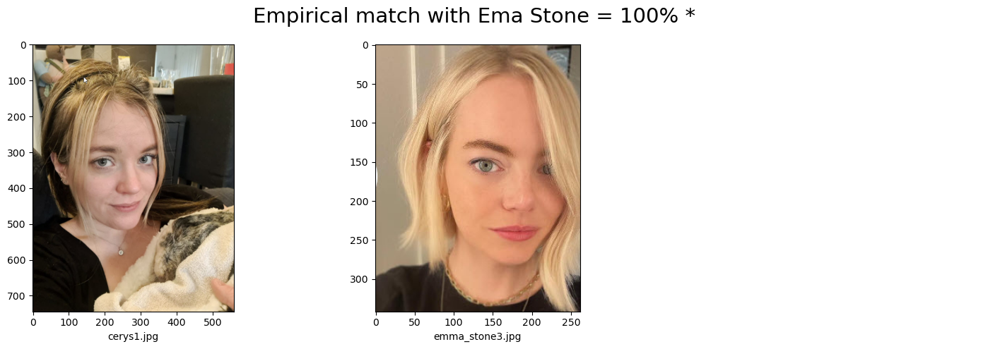

In [574]:
show_image_array(captured_image[1:3], "Empirical match with Ema Stone = 100% *")

##### $(*)$ Empirical method used: common knowledge among most students that known the Subject.

#### Drop Collection

In [409]:
# Drop the entire collection
# collection.drop()

In [342]:
collection.num_entities

187647

In [336]:
import pandas

### Conclusions

### Next Steps

### References
- [Large-scale CelebFaces Attributes (CelebA) Dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)
- [Milvus Installation Documentation](https://milvus.io/docs/install_standalone-docker.md) 
-  [Deep Face Analysis Framework for Face Recognition and Demografy](https://pypi.org/project/deepface/0.0.24/)
- [Display your live webcam feed in a Jupyter notebook using OpenCV](https://abauville.medium.com/display-your-live-webcam-feed-in-a-jupyter-notebook-using-opencv-d01eb75921d1)
- [Gentle Intruduction to face recognition in deep learning](https://sefiks.com/2020/05/01/a-gentle-introduction-to-face-recognition-in-deep-learning/)